In [99]:
from geopy.geocoders import Nominatim
from pprint import pprint
import re

# Noc w muzeum map

Because there is no official map for the event Night at the Museum 2022, I would like to know the location and density of events. Therefore, I have created a short Jupiter file that will pull up the addresses of each event based on text from the official event website.

In [100]:
# Download file with text from official website
f = open('nocwmuzeum.txt', 'r')
content = f.read()
f.close()

In [101]:
# Get street names
result = re.findall("ul\.[a-zA-Z0-9ĄąĆćĘęŁłŃńÓóŚśŹźŻż .\/]*", content)

In [102]:
result[:10]

['ul. płk. Kazimierza Leskiego i Radiowej',
 'ul. Głębocka 66',
 'ul. Modlińskiej 257',
 'ul. Kasprowicza 132',
 'ul. Biograficzna 2',
 'ul. Świerkowa 2',
 'ul. Wiejska 12a',
 'ul. Siekierkowska 28',
 'ul. Narbutta 50a',
 'ul. Obrzeżna 12a']

## Find coordinates

In [168]:
app = Nominatim(user_agent="tutorial")
geo_points = []

In [179]:
for i in range(len(result)):
    street = result[i][4:]
    geo = app.geocode(street+", Warsaw, Poland")
    if geo is not None:
        print(geo.point[:2] + (street,))
        geo_points.append(geo.point[:2] + (street,))

(52.31170285, 21.06735504925074, 'Głębocka 66')
(52.29267195, 20.927861239361352, 'Kasprowicza 132')
(52.30551215, 20.930699033556948, 'Biograficzna 2')
(52.25351, 20.68561, 'Świerkowa 2')
(52.3420782, 20.8875314, 'Wiejska 12a')
(52.21213405, 21.072412641098246, 'Siekierkowska 28')
(52.2055774, 21.0109241, 'Narbutta 50a')
(52.17211305, 21.000512784069613, 'Obrzeżna 12a')
(52.190887, 20.9909692, 'Żuławskiego 4/6')
(52.1861752, 21.0055722, 'Magazynowa 14a')
(52.186774299999996, 21.023494925285792, 'Orkana 14')
(52.1860248, 21.0227159, 'Orkana 14 w Warszawie.')
(52.18900334999999, 21.028371694357716, 'Puławska 113a')
(52.2089096, 21.013184497520786, 'Rakowiecka 4')
(52.17424175, 21.0462500122231, 'Przy Grobli 84')
(52.2009432, 21.01376818334191, 'Dąbrowskiego 51')
(52.2071799, 21.011186666908078, 'Rakowiecka 37')
(52.1954759, 21.022970262603607, 'Tyniecka 40a')
(52.20532505, 21.012995821986017, 'Narbutta 41/43')
(52.20412485, 21.025773600601607, 'Morskie Oko 2')
(52.21041395, 21.046966887

## Plot coordinates

In [180]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [181]:
pd_geo_points = pd.DataFrame(geo_points)
pd_geo_points.columns = ["latitude","longitude","name"]

In [182]:
#box for map, but could be change to have better zoom
BBox = (pd_geo_points.longitude.min(),   pd_geo_points.longitude.max(),      
         pd_geo_points.latitude.min(), pd_geo_points.latitude.max())
BBox

(20.6265010963564, 21.217518, 52.149483, 52.3420782)

In [183]:
ruh_m = plt.imread('warsawmap.png')

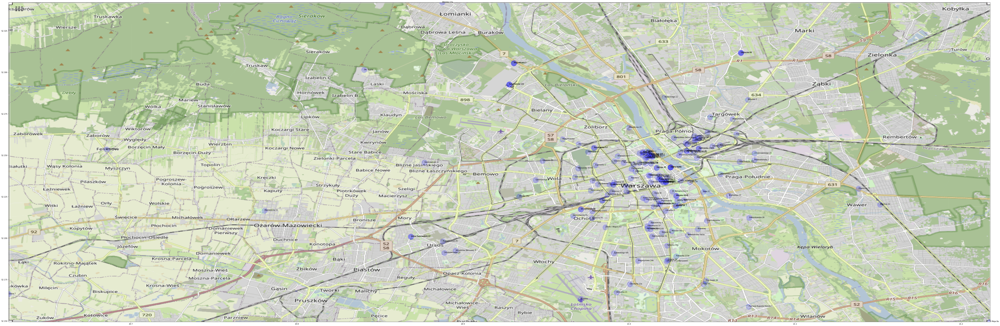

In [184]:
fig, ax = plt.subplots(figsize = (100,100))
ax.scatter(pd_geo_points.longitude, pd_geo_points.latitude, zorder=1, alpha= 0.2, c='b', s=1000)
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal')
for i, txt in enumerate(pd_geo_points.name):
    ax.annotate(txt, (pd_geo_points.longitude[i], pd_geo_points.latitude[i]))

In [185]:
fig.savefig("output2022.png")